Total images: 51
Image shape: (2052, 2560)
Time dimension: 51

--- Statistics ---
Min intensity: 0
Max intensity: 255
Mean intensity: 126.39
Std intensity: 39.19

--- Registration Check ---
Mean absolute difference between frames: 116.71


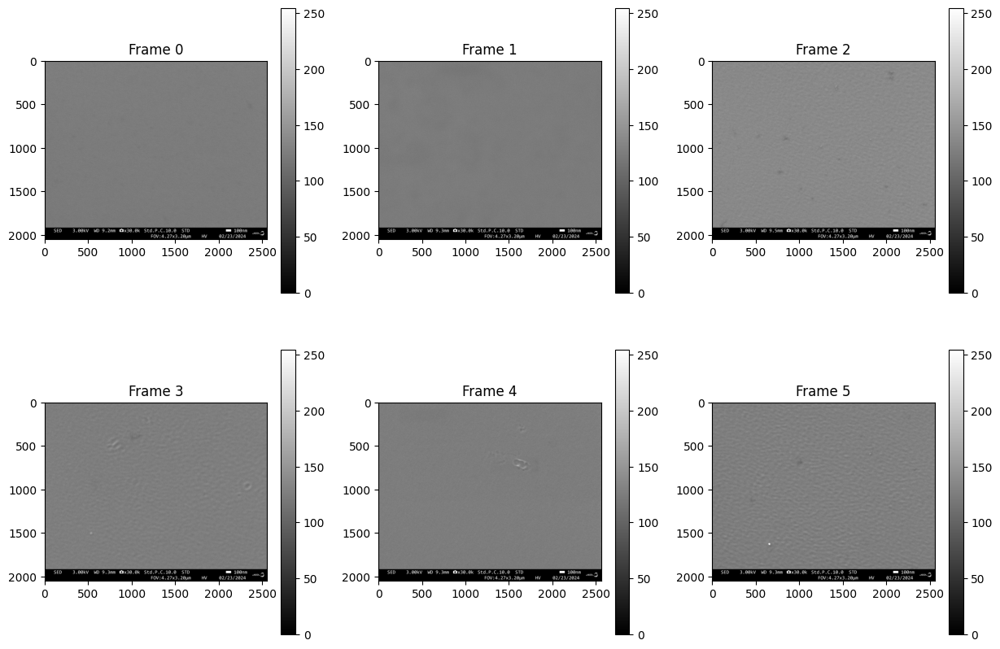

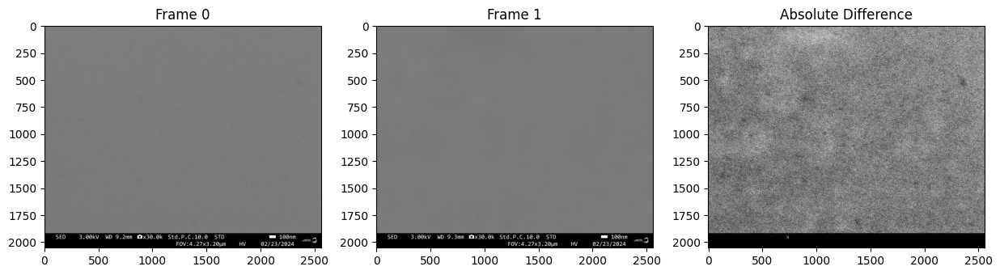

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def analyze_real_images(image_folder):
    """Analyze the characteristics of your real laser-matter images"""
    image_paths = sorted(Path(image_folder).glob("*.tif"))  
    images = []
    
    for path in image_paths:
        img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)  # Or RGB if needed
        images.append(img)
    
    images = np.array(images)  # Shape: (n_time, height, width)
    
    print(f"Total images: {len(images)}")
    print(f"Image shape: {images[0].shape}")
    print(f"Time dimension: {len(images)}")
    
    # Analyze statistics
    print("\n--- Statistics ---")
    print(f"Min intensity: {images.min()}")
    print(f"Max intensity: {images.max()}")
    print(f"Mean intensity: {images.mean():.2f}")
    print(f"Std intensity: {images.std():.2f}")
    
    # Check if images are registered
    print("\n--- Registration Check ---")
    diff_means = []
    for i in range(len(images)-1):
        diff = np.abs(images[i+1] - images[i])
        diff_means.append(diff.mean())
    
    print(f"Mean absolute difference between frames: {np.mean(diff_means):.2f}")

    
    # Visualize sample frames
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            im = ax.imshow(images[i],  cmap='gray')
            ax.set_title(f'Frame {i}')
            plt.colorbar(im, ax=ax)
    
    # Visualize differences
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(images[0],  cmap='gray')
    axes[0].set_title('Frame 0')
    axes[1].imshow(images[1],  cmap='gray')
    axes[1].set_title('Frame 1')
    axes[2].imshow(np.abs(images[1] - images[0]),  cmap='gray')
    axes[2].set_title('Absolute Difference')
    
    return images

# Run analysis'
images = analyze_real_images("C:/Users/Sinjini/Documents/Semester 3/MLDM Project/Real_Images")

In [2]:
diff_mse = []
for i in range(len(images)-1):
    diff = images[i+1].astype(np.float32) - images[i].astype(np.float32)
    diff_mse.append(np.mean(diff**2))
print("Mean squared difference between frames:", np.mean(diff_mse))


Mean squared difference between frames: 970.4024


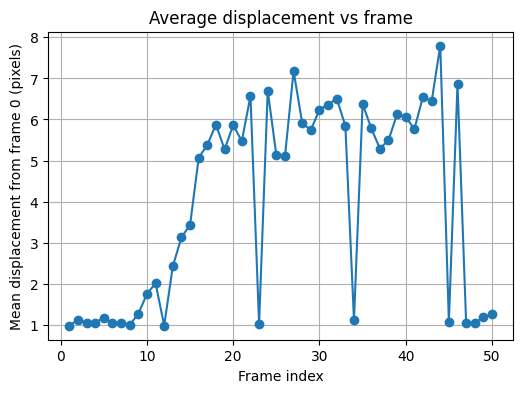

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# images already loaded: shape (T, H, W), uint8 or similar

ref = images[0].astype(np.uint8)   # reference frame
mean_disp = []

for i in range(1, len(images)):
    cur = images[i].astype(np.uint8)

    flow = cv2.calcOpticalFlowFarneback(
        ref, cur, None,
        0.5, 3, 15, 3, 5, 1.2, 0
    )
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    mean_disp.append(mag.mean())

frames = np.arange(1, len(images))

plt.figure(figsize=(6,4))
plt.plot(frames, mean_disp, marker='o')
plt.xlabel("Frame index")
plt.ylabel("Mean displacement from frame 0 (pixels)")
plt.title("Average displacement vs frame")
plt.grid(True)
plt.show()


Processing 51 frames...


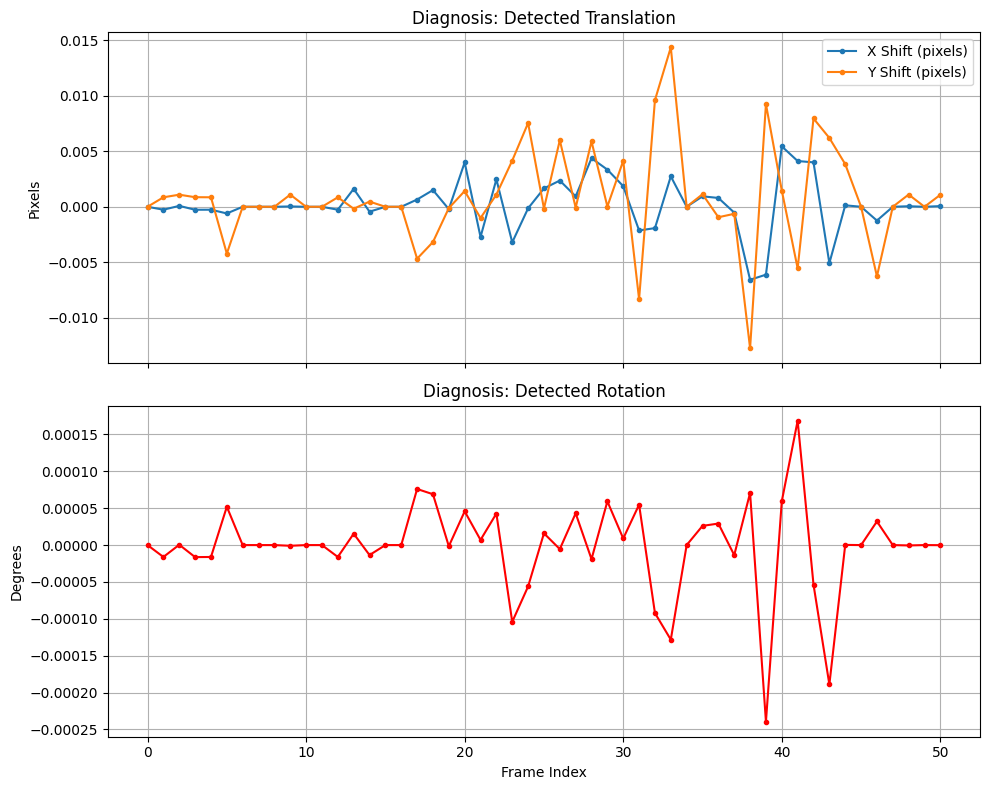

'\n# Optional: Visualize Before vs After for Frame 15 (or any active frame)\n#import matplotlib.pyplot as plt\nraw_images = np.array([cv2.imread(str(p), cv2.IMREAD_GRAYSCALE) for p in sorted(Path(folder_path).glob("*.tif"))])\n\n\nframe_idx = 37 # pick a frame where the movement is high\nplt.figure(figsize=(10,5))\nplt.subplot(1,2,1)\nplt.imshow(raw_images[frame_idx], cmap=\'gray\')\nplt.title(f"Original Frame {frame_idx}")\nplt.subplot(1,2,2)\nplt.imshow(clean_images[frame_idx], cmap=\'gray\')\nplt.title(f"Registered Frame {frame_idx}")\nplt.show()\n'

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def analyze_and_register(image_folder):
    # 1. Load Images
    image_paths = sorted(Path(image_folder).glob("*.tif"))
    images = [cv2.imread(str(p), cv2.IMREAD_GRAYSCALE) for p in image_paths]
    images = np.array(images)
    
    # 2. Setup Reference (Frame 0)
    ref_img = images[0]
    height, width = ref_img.shape
    
    # Initialize storage for motion data
    translations_x = [0]
    translations_y = [0]
    rotations = [0] # In degrees
    
    registered_images = [ref_img] # List to store corrected images
    
    # Initialize ORB detector (Robust feature detection)
    orb = cv2.ORB_create(nfeatures=2000)
    
    # Find keypoints in the clean Frame 0
    kp1, des1 = orb.detectAndCompute(ref_img, None)
    
    print(f"Processing {len(images)} frames...")
    
    # 3. Loop through frames to Calculate & Correct
    for i in range(1, len(images)):
        curr_img = images[i]
        
        # Detect features in current frame
        kp2, des2 = orb.detectAndCompute(curr_img, None)
        
        # Match features
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = matcher.match(des1, des2)
        
        # Extract location of good matches
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        
        # --- DIAGNOSIS STEP ---
        # Estimate a "Partial Affine" transform (Rotation + Translation + Scale)
        # RANSAC will ignore the chaotic laser pixels
        matrix, inliers = cv2.estimateAffinePartial2D(dst_pts, src_pts, method=cv2.RANSAC)
        
        if matrix is None:
            # Fallback if detection fails (rare): assume no movement
            matrix = np.array([[1, 0, 0], [0, 1, 0]], dtype=np.float32)
            
        # Extract components for analysis
        # Matrix is [[cos, -sin, tx], [sin, cos, ty]]
        tx = matrix[0, 2]
        ty = matrix[1, 2]
        
        # Calculate rotation angle from cosine/sine
        # arctan2(sin, cos)
        angle_rad = np.arctan2(matrix[1, 0], matrix[0, 0])
        angle_deg = np.degrees(angle_rad)
        
        translations_x.append(tx)
        translations_y.append(ty)
        rotations.append(angle_deg)
        
        # --- CORRECTION STEP ---
        # Apply the matrix to warp the current image back to match Frame 0
        #registered_img = cv2.warpAffine(curr_img, matrix, (width, height))
        #registered_images.append(registered_img)

    # 4. Visualization of the Diagnosis
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
    
    # Plot Translation
    ax1.plot(translations_x, label='X Shift (pixels)', marker='.')
    ax1.plot(translations_y, label='Y Shift (pixels)', marker='.')
    ax1.set_title("Diagnosis: Detected Translation")
    ax1.set_ylabel("Pixels")
    ax1.legend()
    ax1.grid(True)
    
    # Plot Rotation
    ax2.plot(rotations, color='r', marker='.')
    ax2.set_title("Diagnosis: Detected Rotation")
    ax2.set_ylabel("Degrees")
    ax2.set_xlabel("Frame Index")
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    #return np.array(registered_images)

# --- Run the Code ---
# Replace with your actual path
folder_path = "C:/Users/Sinjini/Documents/Semester 3/MLDM Project/Real_Images"
#clean_images = analyze_and_register(folder_path)
analyze_and_register(folder_path)
#print(f"Registered data shape: {clean_images.shape}")

'''
# Optional: Visualize Before vs After for Frame 15 (or any active frame)
#import matplotlib.pyplot as plt
raw_images = np.array([cv2.imread(str(p), cv2.IMREAD_GRAYSCALE) for p in sorted(Path(folder_path).glob("*.tif"))])


frame_idx = 37 # pick a frame where the movement is high
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(raw_images[frame_idx], cmap='gray')
plt.title(f"Original Frame {frame_idx}")
plt.subplot(1,2,2)
plt.imshow(clean_images[frame_idx], cmap='gray')
plt.title(f"Registered Frame {frame_idx}")
plt.show()
'''

RAW u_xx Variance: 456.42
SMOOTHED u_xx Variance: 10.35


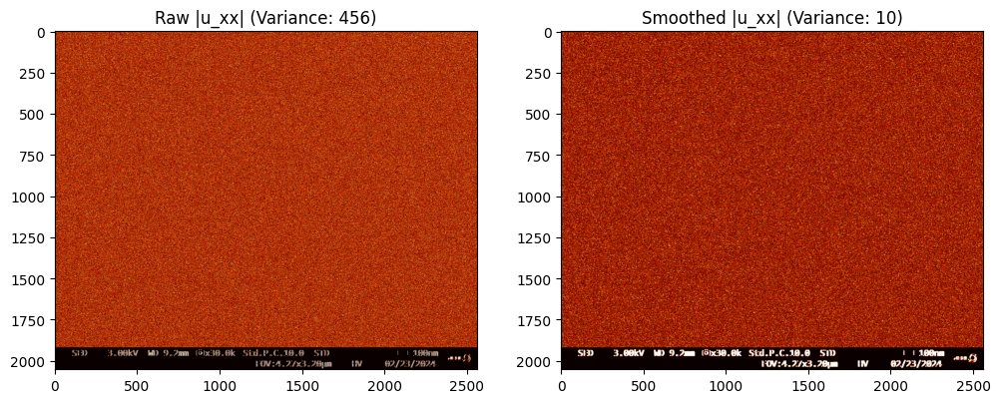

In [26]:
import numpy as np
import cv2
from scipy.ndimage import gaussian_filter

# Assuming 'images' is your (51, H, W) numpy array of grayscale images
# We will check Frame 15 (arbitrary choice)
frame_idx = 0
raw_frame = images[frame_idx]

# 1. Function to calculate 2nd spatial derivative (u_xx) using finite difference
def calculate_uxx(img):
    # The u_xx kernel: [1, -2, 1]
    uxx = cv2.filter2D(img.astype(np.float32), -1, np.array([[1, -2, 1]], dtype=np.float32))
    return uxx

# --- RAW DATA DIAGNOSIS ---
raw_uxx = calculate_uxx(raw_frame)
raw_uxx_variance = np.var(raw_uxx)
print(f"RAW u_xx Variance: {raw_uxx_variance:.2f}")

# --- SMOOTHED DATA DIAGNOSIS ---
# Apply a mild Gaussian filter (simulating denoising)
smoothed_frame = gaussian_filter(raw_frame, sigma=1)
smoothed_uxx = calculate_uxx(smoothed_frame)
smoothed_uxx_variance = np.var(smoothed_uxx)
print(f"SMOOTHED u_xx Variance: {smoothed_uxx_variance:.2f}")

# --- VISUAL PROOF ---
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Display the magnitude of the derivatives
axes[0].imshow(np.abs(raw_uxx), cmap='hot', vmax=np.percentile(np.abs(raw_uxx), 98))
axes[0].set_title(f'Raw |u_xx| (Variance: {raw_uxx_variance:.0f})')
axes[1].imshow(np.abs(smoothed_uxx), cmap='hot', vmax=np.percentile(np.abs(smoothed_uxx), 98))
axes[1].set_title(f'Smoothed |u_xx| (Variance: {smoothed_uxx_variance:.0f})')
plt.show()

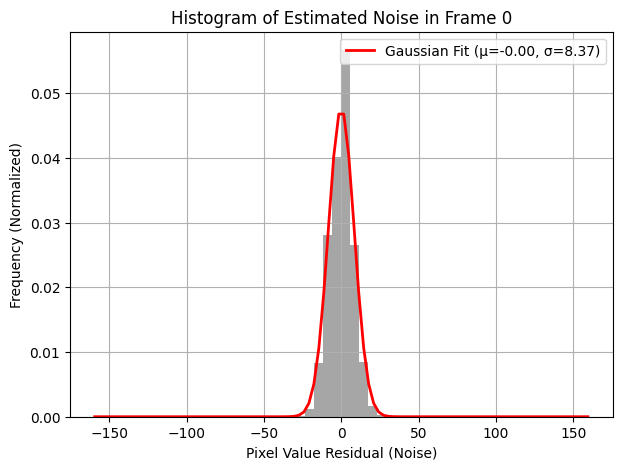

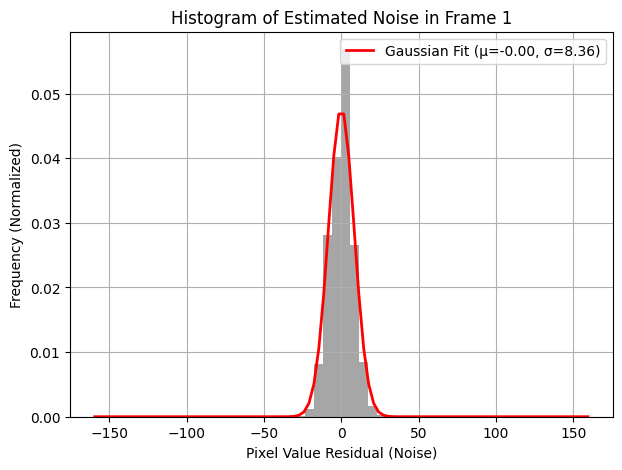

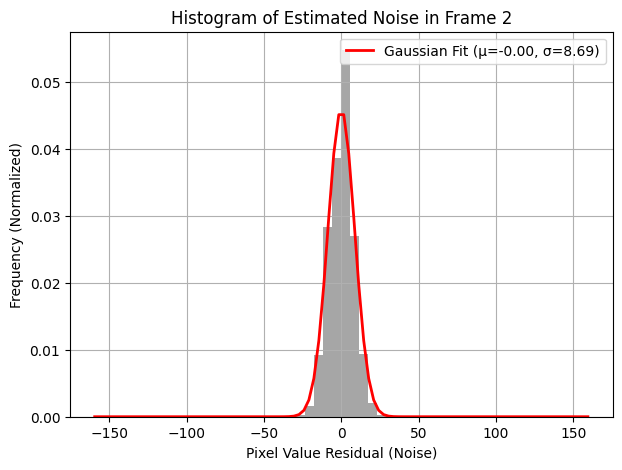

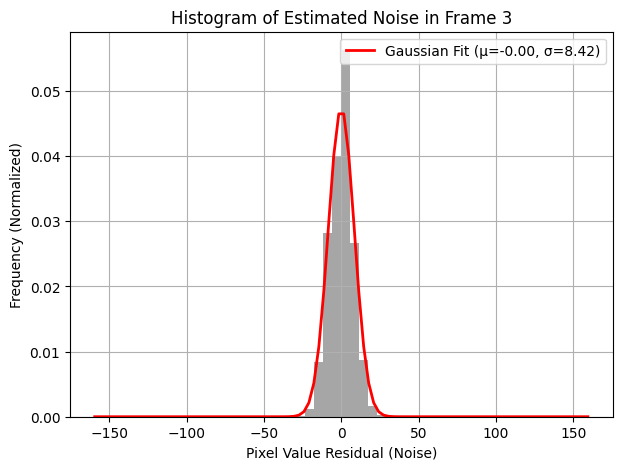

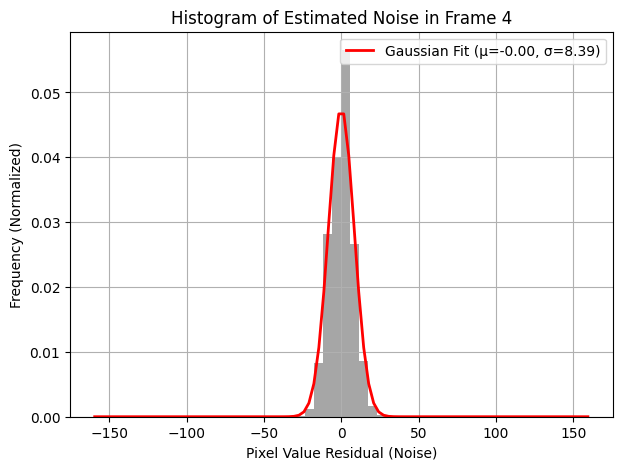

...

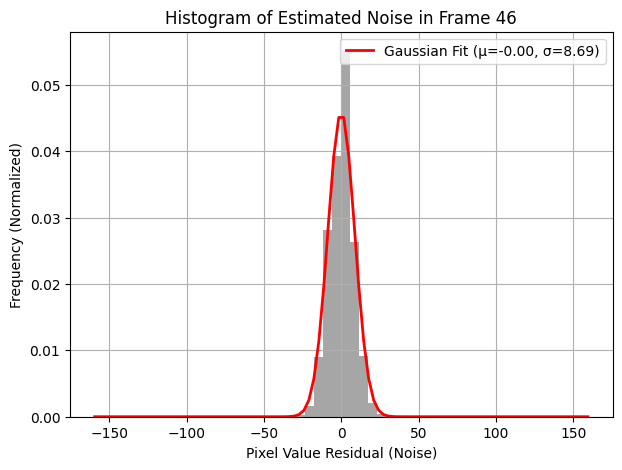

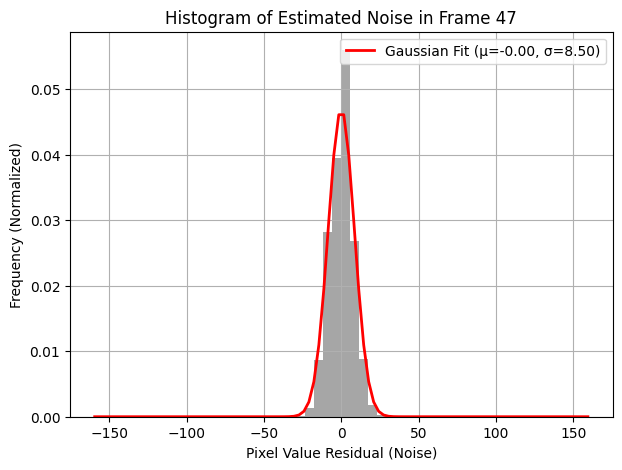

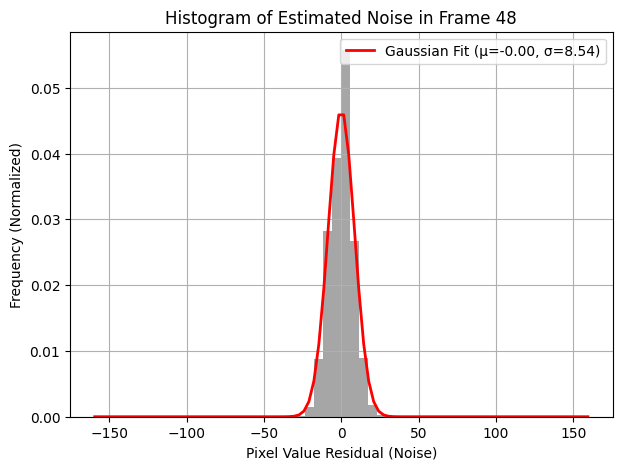

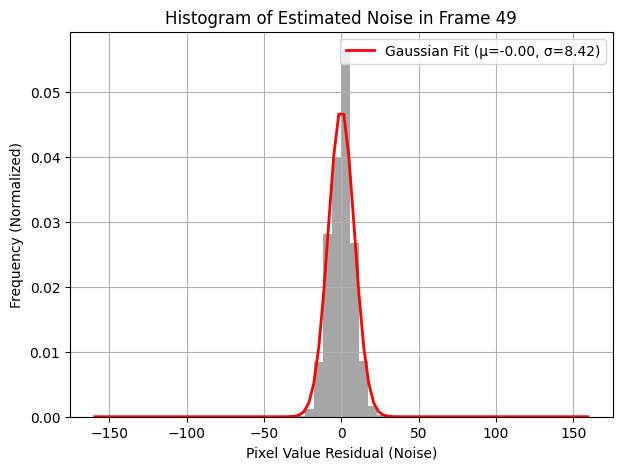

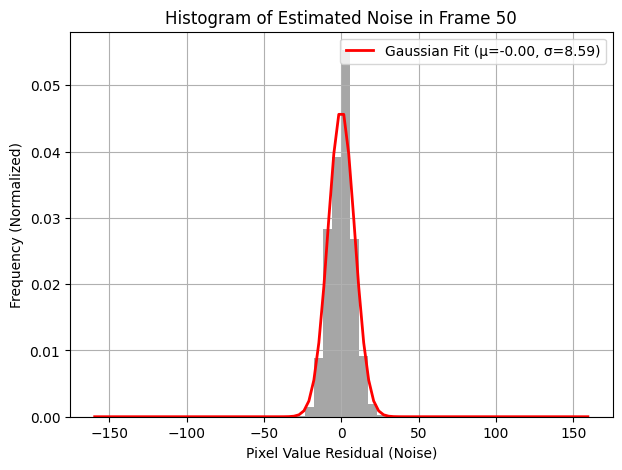

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# 'images' is your loaded (51, H, W) numpy array

for i in range(len(images)):
    frame_i = images[i]
    
    # 1. Estimate the pure noise component.
    # A simple way to estimate noise is by subtracting a heavily blurred version 
    # from the original image. The difference should isolate the high-frequency noise.
    blurred_frame = cv2.GaussianBlur(frame_i, (5, 5), 0)
    noise_estimate = frame_i.astype(np.float32) - blurred_frame.astype(np.float32)
    
    # 2. Flatten and normalize the noise array
    noise_flat = noise_estimate.flatten()
    
    # 3. Plot the histogram of the noise
    plt.figure(figsize=(7, 5))
    plt.hist(noise_flat, bins=50, density=True, color='gray', alpha=0.7)
    
    # Fit a Gaussian curve for visual comparison
    from scipy.stats import norm
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    mu, std = norm.fit(noise_flat)
    p = norm.pdf(x, mu, std)
    
    plt.plot(x, p, 'r', linewidth=2, label=f'Gaussian Fit (μ={mu:.2f}, σ={std:.2f})')
    plt.title(f"Histogram of Estimated Noise in Frame {i}")
    plt.xlabel("Pixel Value Residual (Noise)")
    plt.ylabel("Frequency (Normalized)")
    plt.legend()
    plt.grid(True)
    plt.show()

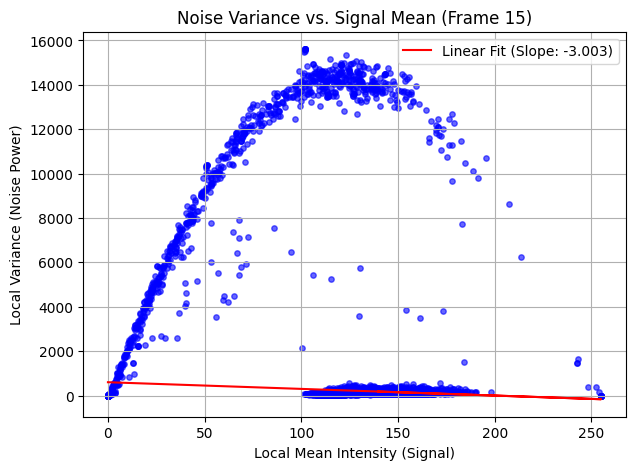

Slope of the fit: -3.003


In [23]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def poisson_check(images, frame_index=15, block_size=10):
    """
    Performs the Variance vs. Mean analysis to check for Poisson noise.
    
    Args:
        images (np.ndarray): The (T, H, W) stack of grayscale images.
        frame_index (int): Index of the brightest frame to analyze (e.g., 40).
        block_size (int): Size of the square block to analyze (e.g., 10x10 pixels).
    """
    
    # 1. Use an active, bright frame to capture potential shot noise
    active_frame = images[frame_index].astype(np.float32)
    
    # 2. Initialize lists to store mean and variance of each block
    means = []
    variances = []
    
    height, width = active_frame.shape
    
    # 3. Loop through the image in non-overlapping blocks
    for y in range(0, height, block_size):
        for x in range(0, width, block_size):
            # Define the block
            block = active_frame[y:y+block_size, x:x+block_size]
            
            # Ensure the block is full size (avoids edge effects if image size isn't divisible)
            if block.shape[0] == block_size and block.shape[1] == block_size:
                
                # Calculate mean and variance for the block
                block_mean = np.mean(block)
                block_variance = np.var(block)
                
                means.append(block_mean)
                variances.append(block_variance)

    # 4. Create the Diagnostic Plot
    plt.figure(figsize=(7, 5))
    plt.scatter(means, variances, s=15, alpha=0.6, color='blue')
    
    # Calculate and plot a linear trend line for easy visualization
    coefficients = np.polyfit(means, variances, 1)
    poly_fn = np.poly1d(coefficients)
    plt.plot(means, poly_fn(means), "r-", 
             label=f'Linear Fit (Slope: {coefficients[0]:.3f})')
    
    plt.title(f"Noise Variance vs. Signal Mean (Frame {frame_index})")
    plt.xlabel("Local Mean Intensity (Signal)")
    plt.ylabel("Local Variance (Noise Power)")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return coefficients[0] # Return the slope of the fit

# --- EXECUTE THE CHECK ---

# You need to run this command:
slope = poisson_check(images) 
print(f"Slope of the fit: {slope:.3f}")

In [38]:


def preprocess_images_corrected(images_raw):

    #CORRECTED denoising pipeline with gentler TV weight.
    
    T, H, W = images_raw.shape
    images_clean = np.zeros_like(images_raw, dtype=np.float32)
    
    for t in range(T):
        img = images_raw[t].astype(np.float32)
        
        # Step 1: Anscombe transform
        img_anscombe = 2.0 * np.sqrt(img + 3.0/8.0)
        
        # Step 2: MUCH GENTLER TV denoising
        # Try these weights in order: 0.01, 0.005, 0.001
        img_denoised = denoise_tv_chambolle(img_anscombe, weight=0.01)
        
        # Step 3: Inverse Anscombe
        img_clean = (img_denoised / 2.0)**2 - 3.0/8.0
        img_clean = np.clip(img_clean, 0, 255)
        
        images_clean[t] = img_clean
    
    # Normalize to [0, 1]
    #images_clean = (images_clean - images_clean.min()) / (images_clean.max() - images_clean.min())
    
    return images_clean


In [41]:
def preprocess_images_gaussian(images_raw):
    T, H, W = images_raw.shape
    images_clean = np.zeros_like(images_raw, dtype=np.float32)
    
    for t in range(T):
        img = images_raw[t].astype(np.float32)
        
        # Anscombe
        img_anscombe = 2.0 * np.sqrt(img + 3.0/8.0)
        
        # Gaussian smoothing (no TV)
        img_denoised = gaussian_filter(img_anscombe, sigma=1.0)
        
        # Inverse Anscombe
        img_clean = (img_denoised / 2.0)**2 - 3.0/8.0
        img_clean = np.clip(img_clean, 0, 255)
        
        images_clean[t] = img_clean
    
    #images_clean = (images_clean - images_clean.min()) / (images_clean.max() - images_clean.min())
    return images_clean


images_clean = preprocess_images_gaussian(images)

#images_clean = preprocess_images_corrected(images)

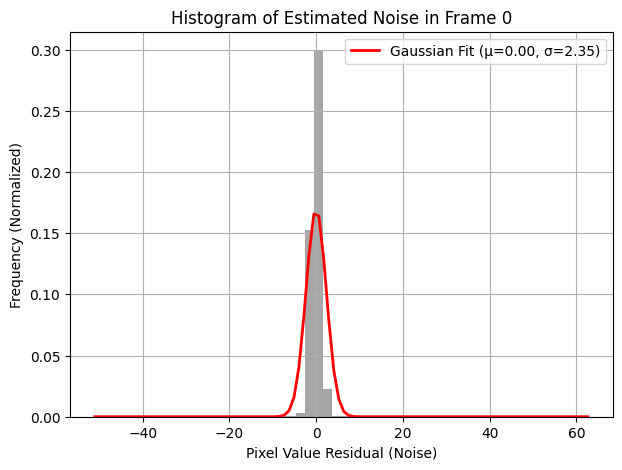

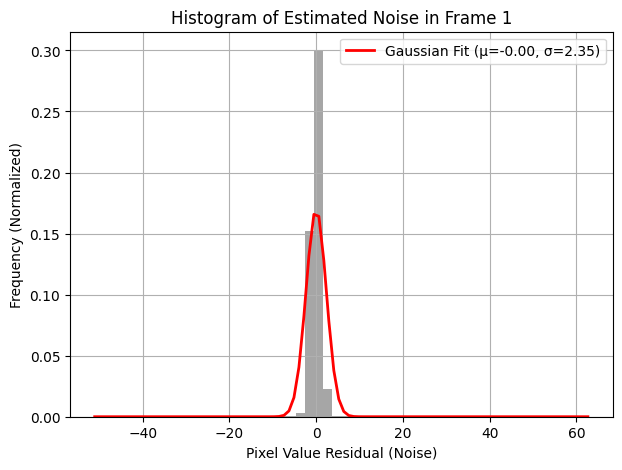

In [42]:
for i in range(len(images_clean[0:2])):
    frame_i = images_clean[i]
    
    # 1. Estimate the pure noise component.
    # A simple way to estimate noise is by subtracting a heavily blurred version 
    # from the original image. The difference should isolate the high-frequency noise.
    blurred_frame = cv2.GaussianBlur(frame_i, (5, 5), 0)
    noise_estimate = frame_i.astype(np.float32) - blurred_frame.astype(np.float32)
    
    # 2. Flatten and normalize the noise array
    noise_flat = noise_estimate.flatten()
    
    # 3. Plot the histogram of the noise
    plt.figure(figsize=(7, 5))
    plt.hist(noise_flat, bins=50, density=True, color='gray', alpha=0.7)
    
    # Fit a Gaussian curve for visual comparison
    from scipy.stats import norm
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    mu, std = norm.fit(noise_flat)
    p = norm.pdf(x, mu, std)
    
    plt.plot(x, p, 'r', linewidth=2, label=f'Gaussian Fit (μ={mu:.2f}, σ={std:.2f})')
    plt.title(f"Histogram of Estimated Noise in Frame {i}")
    plt.xlabel("Pixel Value Residual (Noise)")
    plt.ylabel("Frequency (Normalized)")
    plt.legend()
    plt.grid(True)
    plt.show()

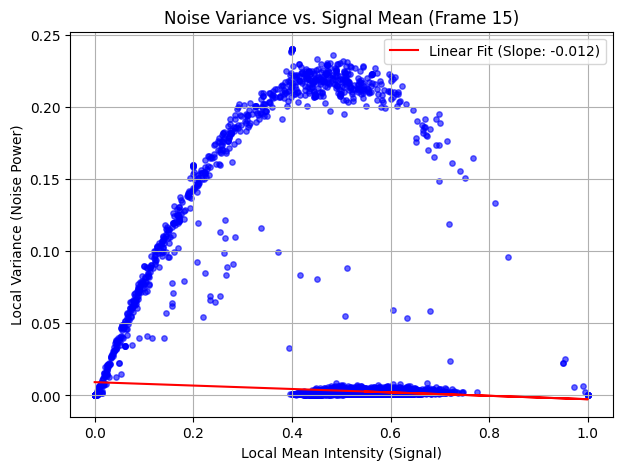

Slope of the fit: -0.012


In [24]:
def poisson_check(images, frame_index=15, block_size=10):
    """
    Performs the Variance vs. Mean analysis to check for Poisson noise.
    
    Args:
        images (np.ndarray): The (T, H, W) stack of grayscale images.
        frame_index (int): Index of the brightest frame to analyze (e.g., 40).
        block_size (int): Size of the square block to analyze (e.g., 10x10 pixels).
    """
    
    # 1. Use an active, bright frame to capture potential shot noise
    active_frame = images[frame_index].astype(np.float32)
    
    # 2. Initialize lists to store mean and variance of each block
    means = []
    variances = []
    
    height, width = active_frame.shape
    
    # 3. Loop through the image in non-overlapping blocks
    for y in range(0, height, block_size):
        for x in range(0, width, block_size):
            # Define the block
            block = active_frame[y:y+block_size, x:x+block_size]
            
            # Ensure the block is full size (avoids edge effects if image size isn't divisible)
            if block.shape[0] == block_size and block.shape[1] == block_size:
                
                # Calculate mean and variance for the block
                block_mean = np.mean(block)
                block_variance = np.var(block)
                
                means.append(block_mean)
                variances.append(block_variance)

    # 4. Create the Diagnostic Plot
    plt.figure(figsize=(7, 5))
    plt.scatter(means, variances, s=15, alpha=0.6, color='blue')
    
    # Calculate and plot a linear trend line for easy visualization
    coefficients = np.polyfit(means, variances, 1)
    poly_fn = np.poly1d(coefficients)
    plt.plot(means, poly_fn(means), "r-", 
             label=f'Linear Fit (Slope: {coefficients[0]:.3f})')
    
    plt.title(f"Noise Variance vs. Signal Mean (Frame {frame_index})")
    plt.xlabel("Local Mean Intensity (Signal)")
    plt.ylabel("Local Variance (Noise Power)")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return coefficients[0] # Return the slope of the fit

# --- EXECUTE THE CHECK ---

# You need to run this command:
slope = poisson_check(images_clean) 
print(f"Slope of the fit: {slope:.3f}")

RAW u_xx Variance: 13.65
SMOOTHED u_xx Variance: 4.80


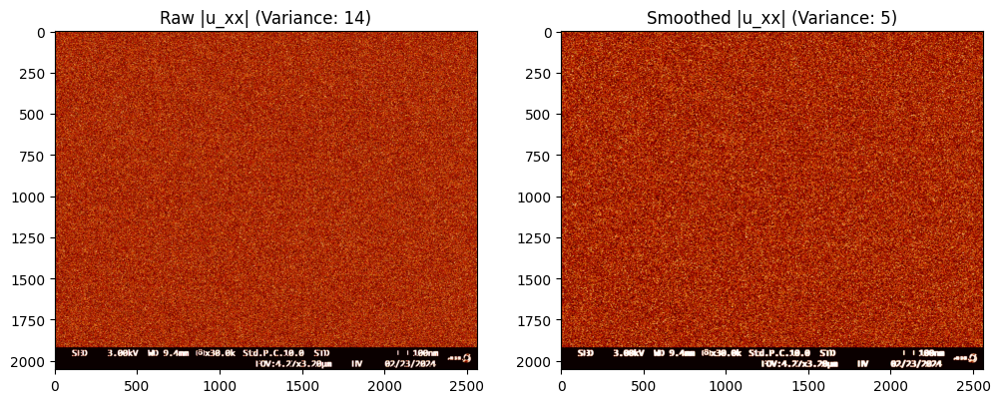

In [46]:
import numpy as np
import cv2
from scipy.ndimage import gaussian_filter

# Assuming 'images' is your (51, H, W) numpy array of grayscale images
# We will check Frame 15 (arbitrary choice)
frame_idx = 45
raw_frame = images_clean[frame_idx]

# 1. Function to calculate 2nd spatial derivative (u_xx) using finite difference
def calculate_uxx(img):
    # The u_xx kernel: [1, -2, 1]
    uxx = cv2.filter2D(img.astype(np.float32), -1, np.array([[1, -2, 1]], dtype=np.float32))
    return uxx

# --- RAW DATA DIAGNOSIS ---
raw_uxx = calculate_uxx(raw_frame)
raw_uxx_variance = np.var(raw_uxx)
print(f"RAW u_xx Variance: {raw_uxx_variance:.2f}")

# --- SMOOTHED DATA DIAGNOSIS ---
# Apply a mild Gaussian filter (simulating denoising)
smoothed_frame = gaussian_filter(raw_frame, sigma=1)
smoothed_uxx = calculate_uxx(smoothed_frame)
smoothed_uxx_variance = np.var(smoothed_uxx)
print(f"SMOOTHED u_xx Variance: {smoothed_uxx_variance:.2f}")

# --- VISUAL PROOF ---
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Display the magnitude of the derivatives
axes[0].imshow(np.abs(raw_uxx), cmap='hot', vmax=np.percentile(np.abs(raw_uxx), 98))
axes[0].set_title(f'Raw |u_xx| (Variance: {raw_uxx_variance:.0f})')
axes[1].imshow(np.abs(smoothed_uxx), cmap='hot', vmax=np.percentile(np.abs(smoothed_uxx), 98))
axes[1].set_title(f'Smoothed |u_xx| (Variance: {smoothed_uxx_variance:.0f})')
plt.show()

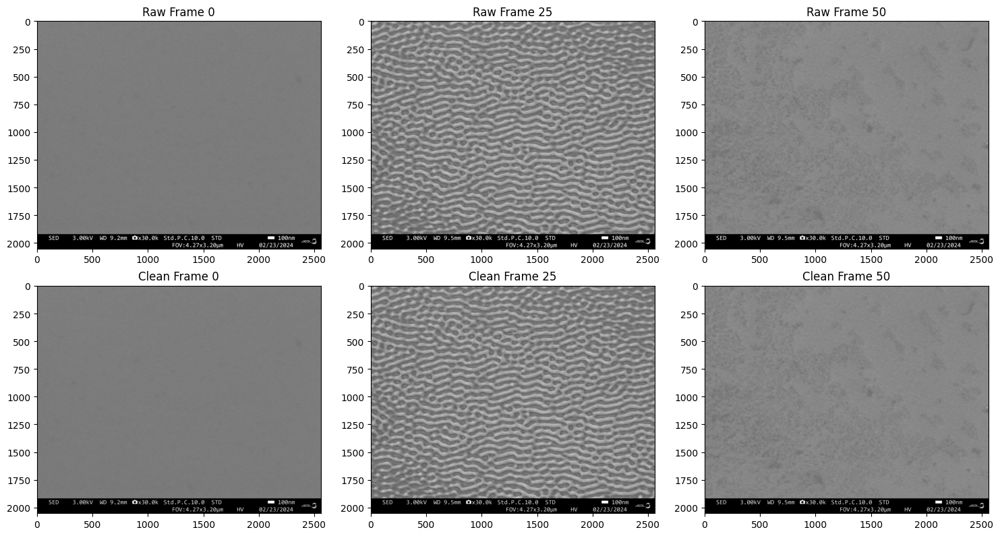

Raw images:
  Frame 0:  mean=117.30, std=31.53
  Frame 25: mean=127.29, std=40.90
  Frame 50: mean=126.04, std=33.69

Cleaned images:
  Frame 0:  mean=116.94, std=29.73
  Frame 25: mean=126.92, std=39.41
  Frame 50: mean=125.68, std=32.00


In [49]:
import matplotlib.pyplot as plt

# Display frames 0, 25, 50 side by side
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

# Raw images
axes[0, 0].imshow(images[0], cmap='gray')
axes[0, 0].set_title('Raw Frame 0')
axes[0, 1].imshow(images[25], cmap='gray')
axes[0, 1].set_title('Raw Frame 25')
axes[0, 2].imshow(images[50], cmap='gray')
axes[0, 2].set_title('Raw Frame 50')

# Clean images
axes[1, 0].imshow(images_clean[0], cmap='gray')
axes[1, 0].set_title('Clean Frame 0')
axes[1, 1].imshow(images_clean[25], cmap='gray')
axes[1, 1].set_title('Clean Frame 25')
axes[1, 2].imshow(images_clean[50], cmap='gray')
axes[1, 2].set_title('Clean Frame 50')

plt.tight_layout()
plt.savefig('visual_check.png', dpi=150)
plt.show()

# Print statistics
print("Raw images:")
print(f"  Frame 0:  mean={images[0].mean():.2f}, std={images[0].std():.2f}")
print(f"  Frame 25: mean={images[25].mean():.2f}, std={images[25].std():.2f}")
print(f"  Frame 50: mean={images[50].mean():.2f}, std={images[50].std():.2f}")

print("\nCleaned images:")
print(f"  Frame 0:  mean={images_clean[0].mean():.2f}, std={images_clean[0].std():.2f}")
print(f"  Frame 25: mean={images_clean[25].mean():.2f}, std={images_clean[25].std():.2f}")
print(f"  Frame 50: mean={images_clean[50].mean():.2f}, std={images_clean[50].std():.2f}")

In [54]:
from skimage.restoration import denoise_tv_chambolle
import numpy as np

def preprocess_images_optimized_tv(images_raw):
    """
    Optimized denoising pipeline running TV filter on the Anscombe-transformed data.
    The weight is increased to effectively suppress the noise in the transformed domain.
    """
    
    T, H, W = images_raw.shape
    images_clean = np.zeros_like(images_raw, dtype=np.float32)
    
    # We must operate on float data
    images_raw = images_raw.astype(np.float32)
    
    # --- Recommended weights to try in order: 0.15, 0.20, 0.25 ---
    # We start with 0.15, which is a good balance for typical image processing tasks.
    TV_WEIGHT = 0.15 
    
    print(f"Applying Anscombe + TV Denoising with Weight={TV_WEIGHT}...")

    for t in range(T):
        img = images_raw[t]
        
        # Step 1: Anscombe transform (Variance Stabilization)
        # Transformed data is roughly in the range [1, 35]
        img_anscombe = 2.0 * np.sqrt(img + 3.0/8.0)
        
        # Step 2: TV denoising 
        # The weight is now strong enough to filter noise in the [1, 35] domain.
        img_denoised = denoise_tv_chambolle(
            img_anscombe, 
            weight=TV_WEIGHT, 
            #multichannel=False
        )
        
        # Step 3: Inverse Anscombe (Scale Restoration)
        img_clean = (img_denoised / 2.0)**2 - 3.0/8.0
        img_clean = np.clip(img_clean, 0, 255)
        
        images_clean[t] = img_clean
        
    # DO NOT NORMALIZE HERE. The data must remain in its physical [0, 255] range 
    # for the derivatives to be physically meaningful.
    print("Denoising complete. Data is in [0, 255] range.")
    return images_clean


images_more_clean = preprocess_images_optimized_tv(images_clean)

Applying Anscombe + TV Denoising with Weight=0.15...
Denoising complete. Data is in [0, 255] range.


RAW u_xx Variance: 11.38
SMOOTHED u_xx Variance: 4.33


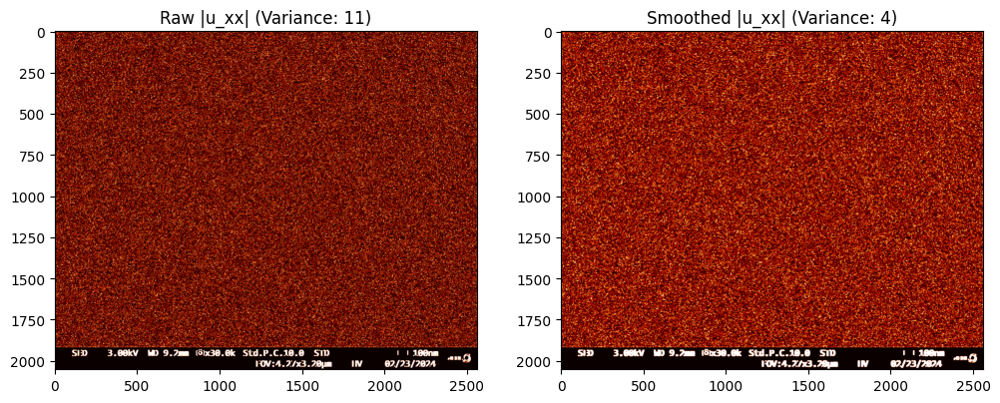

In [56]:
import numpy as np
import cv2
from scipy.ndimage import gaussian_filter

# Assuming 'images' is your (51, H, W) numpy array of grayscale images
# We will check Frame 15 (arbitrary choice)
frame_idx = 0
raw_frame = images_more_clean[frame_idx]

# 1. Function to calculate 2nd spatial derivative (u_xx) using finite difference
def calculate_uxx(img):
    # The u_xx kernel: [1, -2, 1]
    uxx = cv2.filter2D(img.astype(np.float32), -1, np.array([[1, -2, 1]], dtype=np.float32))
    return uxx

# --- RAW DATA DIAGNOSIS ---
raw_uxx = calculate_uxx(raw_frame)
raw_uxx_variance = np.var(raw_uxx)
print(f"RAW u_xx Variance: {raw_uxx_variance:.2f}")

# --- SMOOTHED DATA DIAGNOSIS ---
# Apply a mild Gaussian filter (simulating denoising)
smoothed_frame = gaussian_filter(raw_frame, sigma=1)
smoothed_uxx = calculate_uxx(smoothed_frame)
smoothed_uxx_variance = np.var(smoothed_uxx)
print(f"SMOOTHED u_xx Variance: {smoothed_uxx_variance:.2f}")

# --- VISUAL PROOF ---
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Display the magnitude of the derivatives
axes[0].imshow(np.abs(raw_uxx), cmap='hot', vmax=np.percentile(np.abs(raw_uxx), 98))
axes[0].set_title(f'Raw |u_xx| (Variance: {raw_uxx_variance:.0f})')
axes[1].imshow(np.abs(smoothed_uxx), cmap='hot', vmax=np.percentile(np.abs(smoothed_uxx), 98))
axes[1].set_title(f'Smoothed |u_xx| (Variance: {smoothed_uxx_variance:.0f})')
plt.show()

COMPUTING DERIVATIVES

✅ Derivatives computed successfully!

Shapes:
  u_t:  (51, 2052, 2560)
  u_x:  (51, 2052, 2560)
  u_xx: (51, 2052, 2560)

Ranges (checking for reasonable values):
  u_t:  [-251.383, 251.383]
  u_x:  [-99.259, 99.497]
  u_y:  [-100.027, 100.033]
  u_xx: [-82.823, 91.504]
  u_yy: [-105.885, 79.063]


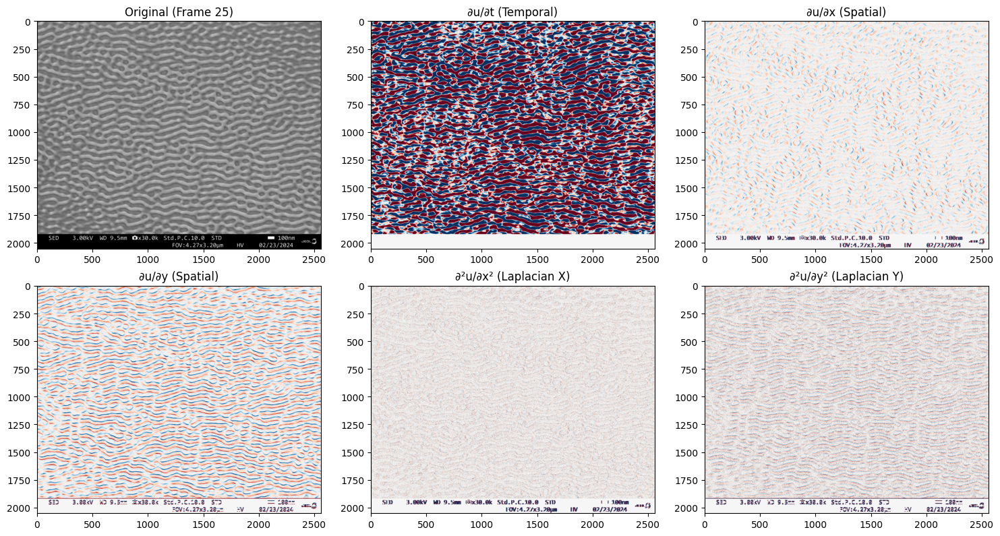


✅ Derivative visualization saved to 'derivatives_visualization.png'


In [57]:
def compute_derivatives(images_clean, dx=1.0, dy=1.0, dt=1.0):
    """
    Compute spatial and temporal derivatives for SINDy.
    
    Args:
        images_clean: (T, H, W) denoised image stack in [0, 255]
        dx, dy: spatial grid spacing (use 1.0 if unknown)
        dt: time step between frames (use 1.0 if unknown, can rescale later)
    
    Returns:
        u_t, u_x, u_y, u_xx, u_yy: derivative arrays
    """
    T, H, W = images_clean.shape
    
    # 1. Temporal derivative (∂u/∂t) - forward difference
    u_t = np.zeros_like(images_clean)
    u_t[:-1] = (images_clean[1:] - images_clean[:-1]) / dt
    # Note: last frame has u_t = 0 (can't compute forward difference)
    
    # 2. First spatial derivatives (∂u/∂x, ∂u/∂y) - central difference
    u_x = np.zeros_like(images_clean)
    u_y = np.zeros_like(images_clean)
    
    u_x[:, :, 1:-1] = (images_clean[:, :, 2:] - images_clean[:, :, :-2]) / (2*dx)
    u_y[:, 1:-1, :] = (images_clean[:, 2:, :] - images_clean[:, :-2, :]) / (2*dy)
    
    # 3. Second spatial derivatives (∂²u/∂x², ∂²u/∂y²) - central difference
    u_xx = np.zeros_like(images_clean)
    u_yy = np.zeros_like(images_clean)
    
    u_xx[:, :, 1:-1] = (images_clean[:, :, 2:] - 2*images_clean[:, :, 1:-1] + 
                         images_clean[:, :, :-2]) / (dx**2)
    u_yy[:, 1:-1, :] = (images_clean[:, 2:, :] - 2*images_clean[:, 1:-1, :] + 
                         images_clean[:, :-2, :]) / (dy**2)
    
    return u_t, u_x, u_y, u_xx, u_yy


# Compute derivatives
print("="*60)
print("COMPUTING DERIVATIVES")
print("="*60)

u_t, u_x, u_y, u_xx, u_yy = compute_derivatives(
    images_more_clean, 
    dx=1.0,  # pixel spacing (or physical spacing if known)
    dy=1.0, 
    dt=1.0   # time step (or physical time if known)
)

print(f"\n✅ Derivatives computed successfully!")
print(f"\nShapes:")
print(f"  u_t:  {u_t.shape}")
print(f"  u_x:  {u_x.shape}")
print(f"  u_xx: {u_xx.shape}")

print(f"\nRanges (checking for reasonable values):")
print(f"  u_t:  [{u_t.min():.3f}, {u_t.max():.3f}]")
print(f"  u_x:  [{u_x.min():.3f}, {u_x.max():.3f}]")
print(f"  u_y:  [{u_y.min():.3f}, {u_y.max():.3f}]")
print(f"  u_xx: [{u_xx.min():.3f}, {u_xx.max():.3f}]")
print(f"  u_yy: [{u_yy.min():.3f}, {u_yy.max():.3f}]")

# Visual check of derivatives
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

frame_idx = 25  # Check active frame

axes[0, 0].imshow(images_more_clean[frame_idx], cmap='gray')
axes[0, 0].set_title('Original (Frame 25)')

axes[0, 1].imshow(u_t[frame_idx], cmap='RdBu', vmin=-20, vmax=20)
axes[0, 1].set_title('∂u/∂t (Temporal)')

axes[0, 2].imshow(u_x[frame_idx], cmap='RdBu', vmin=-10, vmax=10)
axes[0, 2].set_title('∂u/∂x (Spatial)')

axes[1, 0].imshow(u_y[frame_idx], cmap='RdBu', vmin=-10, vmax=10)
axes[1, 0].set_title('∂u/∂y (Spatial)')

axes[1, 1].imshow(u_xx[frame_idx], cmap='RdBu', vmin=-5, vmax=5)
axes[1, 1].set_title('∂²u/∂x² (Laplacian X)')

axes[1, 2].imshow(u_yy[frame_idx], cmap='RdBu', vmin=-5, vmax=5)
axes[1, 2].set_title('∂²u/∂y² (Laplacian Y)')

plt.tight_layout()
plt.savefig('derivatives_visualization.png', dpi=150)
plt.show()

print("\n✅ Derivative visualization saved to 'derivatives_visualization.png'")

In [59]:
def validate_derivatives(u_t, u_xx, u_yy, frame_idx=25):
    """
    Visual inspection of derivative quality.
    """
    import matplotlib.pyplot as plt
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    
    axes[0].imshow(u_t[frame_idx], cmap='RdBu', vmin=-0.1, vmax=0.1)
    axes[0].set_title('∂u/∂t')
    
    axes[1].imshow(u_xx[frame_idx], cmap='RdBu', vmin=-0.1, vmax=0.1)
    axes[1].set_title('∂²u/∂x²')
    
    axes[2].imshow(u_yy[frame_idx], cmap='RdBu', vmin=-0.1, vmax=0.1)
    axes[2].set_title('∂²u/∂y²')
    
    plt.tight_layout()
    plt.savefig('derivative_quality_check.png', dpi=150)
    plt.close()
    
    print(f"u_t range: [{u_t.min():.4f}, {u_t.max():.4f}]")
    print(f"u_xx range: [{u_xx.min():.4f}, {u_xx.max():.4f}]")


validate_derivatives(u_t, u_xx, u_yy)

u_t range: [-251.3828, 251.3828]
u_xx range: [-82.8231, 91.5040]


## The time derivatives are noisy. So we need to do 3D denoising (denoising of the time component as well). So far, we only did denoising of x and y components.

Applying spatiotemporal denoising...
RAW u_xx Variance: 12.14
SMOOTHED u_xx Variance: 4.54


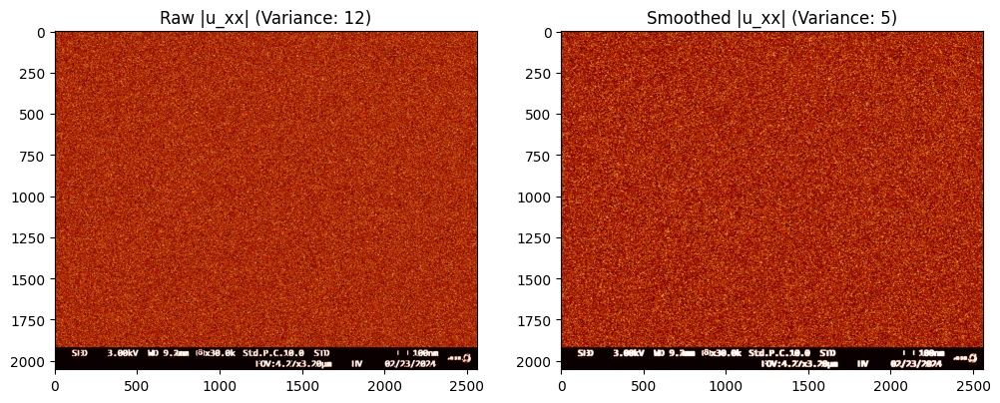

In [65]:
from scipy.ndimage import gaussian_filter

def preprocess_images_spatiotemporal(images_raw):
    """
    Denoising with BOTH spatial AND temporal smoothing.
    """
    T, H, W = images_raw.shape
    
    # Step 1: Anscombe transform (frame-by-frame)
    images_anscombe = np.zeros_like(images_raw, dtype=np.float32)
    for t in range(T):
        img = images_raw[t].astype(np.float32)
        images_anscombe[t] = 2.0 * np.sqrt(img + 3.0/8.0)
    
    # Step 2: 3D Gaussian smoothing (spatial + temporal)
    # sigma = (temporal_sigma, spatial_sigma_y, spatial_sigma_x)
    images_denoised = gaussian_filter(
        images_anscombe, 
        sigma=(1.0, 1.0, 1.0)  # Smooth in time and space
    )
    
    # Step 3: Inverse Anscombe transform (frame-by-frame)
    images_clean = np.zeros_like(images_raw, dtype=np.float32)
    for t in range(T):
        img_clean = (images_denoised[t] / 2.0)**2 - 3.0/8.0
        img_clean = np.clip(img_clean, 0, 255)
        images_clean[t] = img_clean
    
    return images_clean


# Apply 3D denoising
print("Applying spatiotemporal denoising...")
images_clean_3d = preprocess_images_spatiotemporal(images)






RAW u_xx Variance: 11.57
SMOOTHED u_xx Variance: 4.45


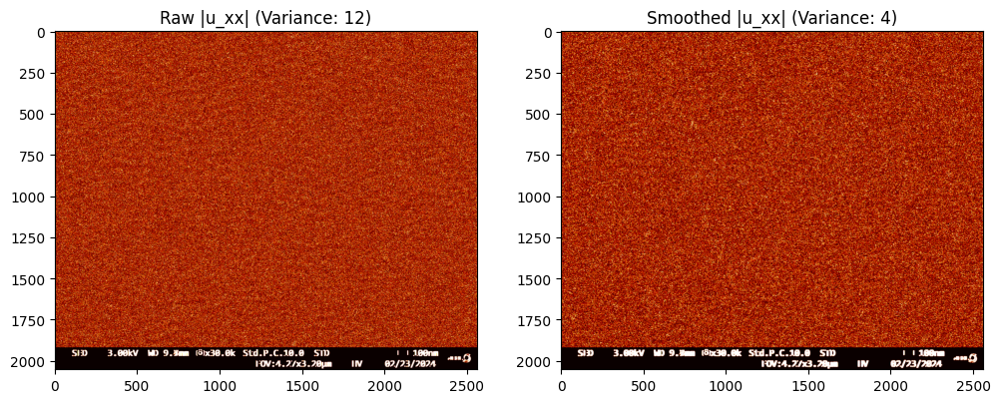

In [67]:
frame_idx = 35
raw_frame = images_clean_3d[frame_idx]

# 1. Function to calculate 2nd spatial derivative (u_xx) using finite difference
def calculate_uxx(img):
    # The u_xx kernel: [1, -2, 1]
    uxx = cv2.filter2D(img.astype(np.float32), -1, np.array([[1, -2, 1]], dtype=np.float32))
    return uxx

# --- RAW DATA DIAGNOSIS ---
raw_uxx = calculate_uxx(raw_frame)
raw_uxx_variance = np.var(raw_uxx)
print(f"RAW u_xx Variance: {raw_uxx_variance:.2f}")

# --- SMOOTHED DATA DIAGNOSIS ---
# Apply a mild Gaussian filter (simulating denoising)
smoothed_frame = gaussian_filter(raw_frame, sigma=1)
smoothed_uxx = calculate_uxx(smoothed_frame)
smoothed_uxx_variance = np.var(smoothed_uxx)
print(f"SMOOTHED u_xx Variance: {smoothed_uxx_variance:.2f}")

# --- VISUAL PROOF ---
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Display the magnitude of the derivatives
axes[0].imshow(np.abs(raw_uxx), cmap='hot', vmax=np.percentile(np.abs(raw_uxx), 98))
axes[0].set_title(f'Raw |u_xx| (Variance: {raw_uxx_variance:.0f})')
axes[1].imshow(np.abs(smoothed_uxx), cmap='hot', vmax=np.percentile(np.abs(smoothed_uxx), 98))
axes[1].set_title(f'Smoothed |u_xx| (Variance: {smoothed_uxx_variance:.0f})')
plt.show()



In [66]:



# Recompute derivatives
u_t, u_x, u_y, u_xx, u_yy = compute_derivatives(
    images_clean_3d, 
    dx=1.0, dy=1.0, dt=1.0
)

print(f"\nNew u_t range: [{u_t.min():.3f}, {u_t.max():.3f}]")


New u_t range: [-100.521, 100.577]


COMPUTING DERIVATIVES

✅ Derivatives computed successfully!

Shapes:
  u_t:  (51, 2052, 2560)
  u_x:  (51, 2052, 2560)
  u_xx: (51, 2052, 2560)

Ranges (checking for reasonable values):
  u_t:  [-100.521, 100.577]
  u_x:  [-99.260, 99.500]
  u_y:  [-100.027, 100.030]
  u_xx: [-84.120, 95.107]
  u_yy: [-110.454, 79.451]


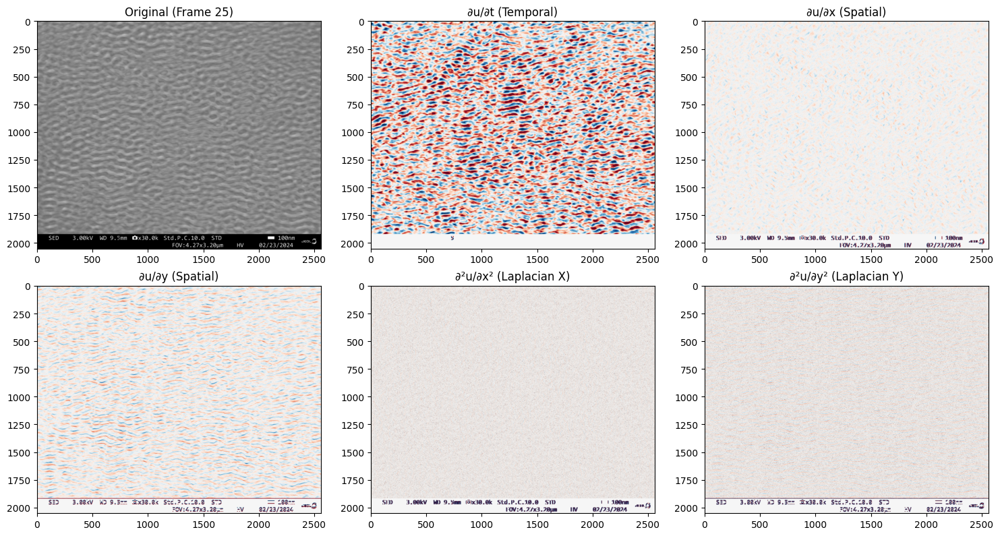


✅ Derivative visualization saved to 'derivatives_visualization.png'


In [68]:
def compute_derivatives(images_clean, dx=1.0, dy=1.0, dt=1.0):
    """
    Compute spatial and temporal derivatives for SINDy.
    
    Args:
        images_clean: (T, H, W) denoised image stack in [0, 255]
        dx, dy: spatial grid spacing (use 1.0 if unknown)
        dt: time step between frames (use 1.0 if unknown, can rescale later)
    
    Returns:
        u_t, u_x, u_y, u_xx, u_yy: derivative arrays
    """
    T, H, W = images_clean.shape
    
    # 1. Temporal derivative (∂u/∂t) - forward difference
    u_t = np.zeros_like(images_clean)
    u_t[:-1] = (images_clean[1:] - images_clean[:-1]) / dt
    # Note: last frame has u_t = 0 (can't compute forward difference)
    
    # 2. First spatial derivatives (∂u/∂x, ∂u/∂y) - central difference
    u_x = np.zeros_like(images_clean)
    u_y = np.zeros_like(images_clean)
    
    u_x[:, :, 1:-1] = (images_clean[:, :, 2:] - images_clean[:, :, :-2]) / (2*dx)
    u_y[:, 1:-1, :] = (images_clean[:, 2:, :] - images_clean[:, :-2, :]) / (2*dy)
    
    # 3. Second spatial derivatives (∂²u/∂x², ∂²u/∂y²) - central difference
    u_xx = np.zeros_like(images_clean)
    u_yy = np.zeros_like(images_clean)
    
    u_xx[:, :, 1:-1] = (images_clean[:, :, 2:] - 2*images_clean[:, :, 1:-1] + 
                         images_clean[:, :, :-2]) / (dx**2)
    u_yy[:, 1:-1, :] = (images_clean[:, 2:, :] - 2*images_clean[:, 1:-1, :] + 
                         images_clean[:, :-2, :]) / (dy**2)
    
    return u_t, u_x, u_y, u_xx, u_yy


# Compute derivatives
print("="*60)
print("COMPUTING DERIVATIVES")
print("="*60)

u_t, u_x, u_y, u_xx, u_yy = compute_derivatives(
    images_clean_3d, 
    dx=1.0,  # pixel spacing (or physical spacing if known)
    dy=1.0, 
    dt=1.0   # time step (or physical time if known)
)

print(f"\n✅ Derivatives computed successfully!")
print(f"\nShapes:")
print(f"  u_t:  {u_t.shape}")
print(f"  u_x:  {u_x.shape}")
print(f"  u_xx: {u_xx.shape}")

print(f"\nRanges (checking for reasonable values):")
print(f"  u_t:  [{u_t.min():.3f}, {u_t.max():.3f}]")
print(f"  u_x:  [{u_x.min():.3f}, {u_x.max():.3f}]")
print(f"  u_y:  [{u_y.min():.3f}, {u_y.max():.3f}]")
print(f"  u_xx: [{u_xx.min():.3f}, {u_xx.max():.3f}]")
print(f"  u_yy: [{u_yy.min():.3f}, {u_yy.max():.3f}]")

# Visual check of derivatives
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

frame_idx = 25  # Check active frame

axes[0, 0].imshow(images_clean_3d[frame_idx], cmap='gray')
axes[0, 0].set_title('Original (Frame 25)')

axes[0, 1].imshow(u_t[frame_idx], cmap='RdBu', vmin=-20, vmax=20)
axes[0, 1].set_title('∂u/∂t (Temporal)')

axes[0, 2].imshow(u_x[frame_idx], cmap='RdBu', vmin=-10, vmax=10)
axes[0, 2].set_title('∂u/∂x (Spatial)')

axes[1, 0].imshow(u_y[frame_idx], cmap='RdBu', vmin=-10, vmax=10)
axes[1, 0].set_title('∂u/∂y (Spatial)')

axes[1, 1].imshow(u_xx[frame_idx], cmap='RdBu', vmin=-5, vmax=5)
axes[1, 1].set_title('∂²u/∂x² (Laplacian X)')

axes[1, 2].imshow(u_yy[frame_idx], cmap='RdBu', vmin=-5, vmax=5)
axes[1, 2].set_title('∂²u/∂y² (Laplacian Y)')

plt.tight_layout()
plt.savefig('derivatives_visualization.png', dpi=150)
plt.show()

print("\n✅ Derivative visualization saved to 'derivatives_visualization.png'")

The time derivatives are still noisy. 

In [74]:
type(images_clean_3d)

numpy.ndarray

In [2]:
import numpy as np
import h5py


u = images_clean_3d          # shape: (Nt, Ny, Nx)
Nt, Ny, Nx = u.shape

x = np.linspace(0, Nx-1, Nx)
y = np.linspace(0, Ny-1, Ny)
t = np.arange(Nt)

#with h5py.File("images_clean_3d.h5", "w") as f:
#    f.create_dataset("u", data=u)
#    f.create_dataset("x", data=x)
#    f.create_dataset("y", data=y)
#    f.create_dataset("t", data=t)


In [1]:
import h5py
import numpy as np
#with h5py.File("images_clean_3d.h5", "r") as f:
#    print(list(f.keys()))

In [2]:
with h5py.File("images_clean_3d.h5", "r") as f:
    x = np.array(f["x"])      
    y = np.array(f["y"])      
    t = np.array(f["t"])
    u = np.array(f["u"])#[:, ::20, ::20])

dt = t[1] - t[0]
dx = x[1] - x[0]
dy = y[1] - y[0]

dt = dt.astype(np.float64)

In [3]:
dt, dx, dy

(np.float64(1.0), np.float64(1.0), np.float64(1.0))

In [4]:
x.shape, y.shape, u.shape, t.shape

((2560,), (2052,), (51, 2052, 2560), (51,))

Data shape: (51, 2052, 2560)
Variance map calculated. Shape: (2052, 2560)

SUGGESTED REGION OF INTEREST (ROI)
Based on 99.5th percentile of temporal variance:
X-Axis (Width): [0, 2560]
Y-Axis (Height): [0, 1993]
Suggested Crop Size: 1993 x 2560 pixels


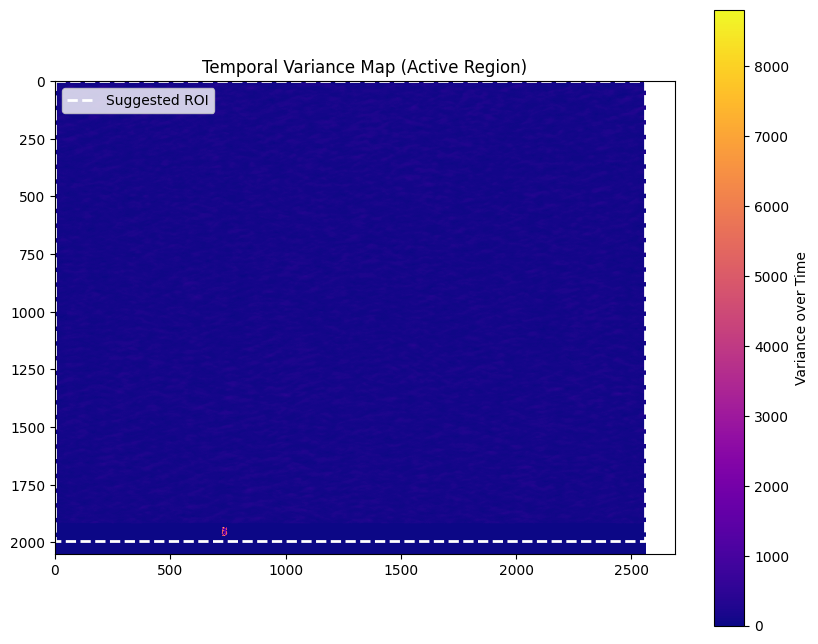

In [2]:
import numpy as np
import h5py
import matplotlib.pyplot as plt

# --- 1. Load the data ---
try:
    with h5py.File("images_clean_3d.h5", "r") as f:
        u = np.array(f["u"])  # (Nt, Ny, Nx)
except FileNotFoundError:
    print("CRITICAL ERROR: 'images_clean_3d.h5' not found.")
    exit()

Nt, Ny, Nx = u.shape
print(f"Data shape: {u.shape}")

# --- 2. Calculate the Variance Image ---
# np.var(u, axis=0) calculates the variance of each pixel across all time steps.
variance_map = np.var(u, axis=0)
print(f"Variance map calculated. Shape: {variance_map.shape}")

# --- 3. Visualize the Map and Suggest ROI ---

# We use a histogram to find a good threshold. 
# The bulk of the pixels (static background) will have low variance.
# The plume will be above a certain threshold.
threshold = np.percentile(variance_map, 99.5) # Look for the top 0.5% most active pixels

# Create a binary mask of the active region
active_mask = variance_map > threshold

# Find the bounding box coordinates [y_start, y_end, x_start, x_end]
active_indices = np.argwhere(active_mask)

if active_indices.size == 0:
    # Fallback if no activity is detected, but this shouldn't happen with your data
    Y_START, Y_END = 0, Ny
    X_START, X_END = 0, Nx
    print("No concentrated activity detected. Using full image bounds.")
else:
    Y_START = active_indices[:, 0].min()
    Y_END = active_indices[:, 0].max() + 1
    X_START = active_indices[:, 1].min()
    X_END = active_indices[:, 1].max() + 1
    
# Add a small buffer around the detected activity for safety
BUFFER = 20 
Y_START = max(0, Y_START - BUFFER)
Y_END = min(Ny, Y_END + BUFFER)
X_START = max(0, X_START - BUFFER)
X_END = min(Nx, X_END + BUFFER)
    
suggested_roi = (X_START, X_END, Y_START, Y_END)

print("\n" + "="*60)
print("SUGGESTED REGION OF INTEREST (ROI)")
print(f"Based on 99.5th percentile of temporal variance:")
print(f"X-Axis (Width): [{X_START}, {X_END}]")
print(f"Y-Axis (Height): [{Y_START}, {Y_END}]")
print(f"Suggested Crop Size: {Y_END - Y_START} x {X_END - X_START} pixels")
print("="*60)


# Display the image for visual confirmation
plt.figure(figsize=(10, 8))
plt.imshow(variance_map, cmap='plasma', interpolation='nearest')
plt.title('Temporal Variance Map (Active Region)')
plt.colorbar(label='Variance over Time')

# Draw the suggested bounding box
plt.plot([X_START, X_END, X_END, X_START, X_START], 
         [Y_START, Y_START, Y_END, Y_END, Y_START], 
         'w--', linewidth=2, label='Suggested ROI')
plt.legend()
plt.show()



In [5]:
import pysindy as ps


X, Y, T = np.meshgrid(x, y, t, indexing="ij")
print("meshgrid created")

XYT = np.asarray([T, Y, X]).T
print("Spatiotemporal grid created")

weak_lib = ps.WeakPDELibrary(
#     library_functions=library_functions,
#     function_names=library_function_names,
    function_library=ps.PolynomialLibrary(degree=2,include_bias=False),
    derivative_order=2,
    spatiotemporal_grid=XYT,
    is_uniform=True,
    periodic=True,
    K=100,
    include_interaction=False,
)

print("Library created")

meshgrid created
Spatiotemporal grid created


c:\Users\Sinjini\anaconda3\envs\mldmproj\lib\site-packages\pysindy\feature_library\weak_pde_library.py:177: UserWarning: is_uniform and periodic have been deprecated.in favor of differetiation_method and diff_kwargs.
  warnings.warn(


Library created


In [ ]:
# THis is where the code crashes. 


optimizer = ps.STLSQ(threshold=0.05, alpha=1e-8, normalize_columns=True)
model = ps.SINDy(feature_library=weak_lib, optimizer=optimizer)
model.fit(u, dt)
model.print()

In [9]:
u.shape

(51, 2052, 2560)